In [1]:
# Importing libraries
import numpy as np
import pandas as pd

# Data visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
%matplotlib inline

# Disable Python warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Load dataset
ok_df = pd.read_csv('okcupid_profiles.csv')
# Look Top & Last 5 rows of data
ok_df

FileNotFoundError: [Errno 2] No such file or directory: 'okcupid_profiles.csv'

## I'm working on few stages to check the dataset

### 1. Data Cleaning

### 2. EDA

### 3. Data Preprocessing

### 4. Model building & Evaluation

## 1. Data Cleaning

In [ ]:
# Statistical describe
ok_df.describe()

,age,height,income
count,59946.000000,59943.000000,59946.000000
mean,32.340290,68.295281,20033.222534
std,9.452779,3.994803,97346.192104
min,18.000000,1.000000,-1.000000
25%,26.000000,66.000000,-1.000000
50%,30.000000,68.000000,-1.000000
75%,37.000000,71.000000,-1.000000
max,110.000000,95.000000,1000000.000000


In [ ]:
# Change rows where income is -1 to NA
ok_df.loc[ok_df['income'] == -1, 'income'] = np.nan

In [ ]:
# Check data shape
ok_df.shape

(59946, 31)

In [ ]:
# Check missing values
ok_df.isna().sum()

age                0
status             0
sex                0
orientation        0
body_type       5296
diet           24395
drinks          2985
drugs          14080
education       6628
ethnicity       5680
height             3
income         48442
job             8198
last_online        0
location           0
offspring      35561
pets           19921
religion       20226
sign           11056
smokes          5512
speaks            50
essay0          5488
essay1          7572
essay2          9638
essay3         11476
essay4         10537
essay5         10850
essay6         13771
essay7         12451
essay8         19225
essay9         12603
dtype: int64

In [ ]:
# Missing columns
[col for col in ok_df.columns if ok_df[col].isnull().sum() > 0]

['body_type',
 'diet',
 'drinks',
 'drugs',
 'education',
 'ethnicity',
 'height',
 'income',
 'job',
 'offspring',
 'pets',
 'religion',
 'sign',
 'smokes',
 'speaks',
 'essay0',
 'essay1',
 'essay2',
 'essay3',
 'essay4',
 'essay5',
 'essay6',
 'essay7',
 'essay8',
 'essay9']

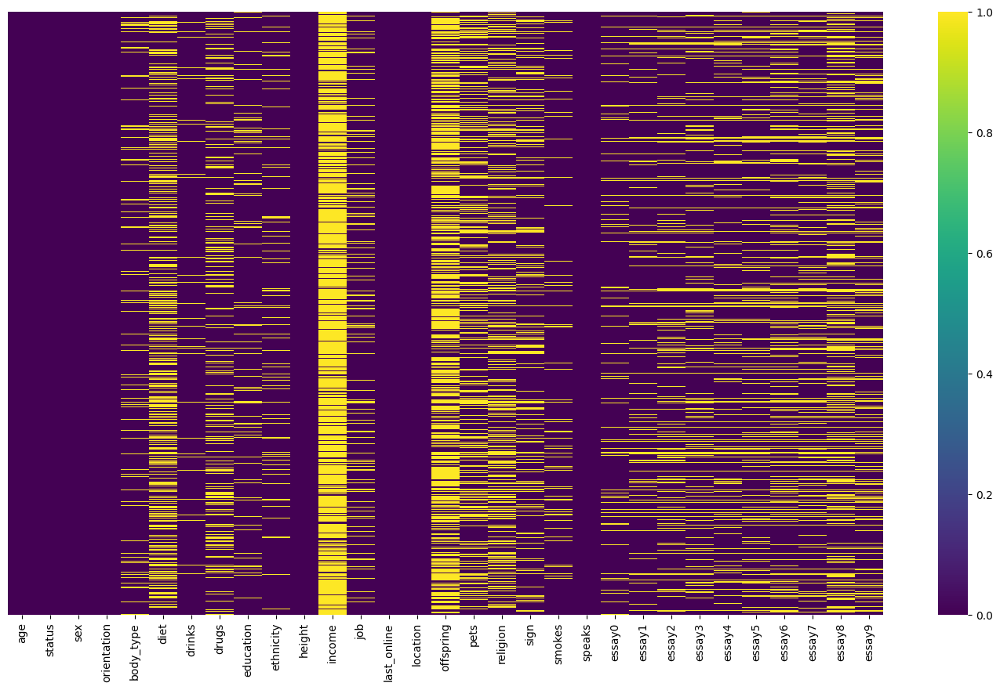

In [ ]:
# Heatmap of missing cols
plt.figure(figsize=(18,10))
sns.heatmap(ok_df.isnull(), yticklabels=False,  cmap='viridis')
plt.show()

In [ ]:
# Check duplicate values
ok_df.duplicated().sum()

0

In [ ]:
# Check dtype of cols
ok_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59946 entries, 0 to 59945
Data columns (total 31 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   age          59946 non-null  int64  
 1   status       59946 non-null  object 
 2   sex          59946 non-null  object 
 3   orientation  59946 non-null  object 
 4   body_type    54650 non-null  object 
 5   diet         35551 non-null  object 
 6   drinks       56961 non-null  object 
 7   drugs        45866 non-null  object 
 8   education    53318 non-null  object 
 9   ethnicity    54266 non-null  object 
 10  height       59943 non-null  float64
 11  income       11504 non-null  float64
 12  job          51748 non-null  object 
 13  last_online  59946 non-null  object 
 14  location     59946 non-null  object 
 15  offspring    24385 non-null  object 
 16  pets         40025 non-null  object 
 17  religion     39720 non-null  object 
 18  sign         48890 non-null  object 
 19  smok

In [ ]:
ok_df['essay0'][2]

"i'm not ashamed of much, but writing public text on an online dating site makes me pleasantly uncomfortable. i'll try to be as earnest as possible in the noble endeavor of standing naked before the world.  i've lived in san francisco for 15 years, and both love it and find myself frustrated with its deficits. lots of great friends and acquaintances (which increases my apprehension to put anything on this site), but i'm feeling like meeting some new people that aren't just friends of friends. it's okay if you are a friend of a friend too. chances are, if you make it through the complex filtering process of multiple choice questions, lifestyle statistics, photo scanning, and these indulgent blurbs of text without moving quickly on to another search result, you are probably already a cultural peer and at most 2 people removed. at first, i thought i should say as little as possible here to avoid you, but that seems silly.  as far as culture goes, i'm definitely more on the weird side of t

### Observation:

- 'essay0' : about me & about you detail.
- 'essay1' : currently working, in which company & what kind of work doing etc.
- 'essay2' : confidence level & finding detaill.
- 'essay3' : height size & looks detail.
- 'essay4' : books,movie,shows,music & food detail.
- 'essay5' : food,water,cell phone, & shelter detail.
- 'essay6' : duality and humorous things detail.
- 'essay7' : find someone to hang out with detail.
- 'essay8' : i am new to california and looking for someone detail.
- 'essay9' : you want to be swept off your feet! you are tired of the norm detail.

In [ ]:
# Convert height inch into cm
ok_df['height'] = ok_df['height'].apply(lambda x: round(x * 2.54, 0))

In [ ]:
# Find the average height of each gender
m_mean = round(ok_df.loc[ok_df['sex'] == 'm', 'height'].mean(), 0)
f_mean = round(ok_df.loc[ok_df['sex'] == 'f', 'height'].mean(), 0)

In [ ]:
m_mean

179.0

In [ ]:
f_mean

165.0

In [ ]:
# NA values are replaced with the average height of men and women.
ok_df.loc[(ok_df['height'] <= 100) & (ok_df['sex']=='f'), 'height'] = f_mean
ok_df.loc[(ok_df['height'] <= 100) & (ok_df['sex']=='m'), 'height'] = m_mean

In [ ]:
# Remove columns income,offspring,drinks,drugs,pets & essay0-to-essay9
ok_df.drop(columns=['income', 'offspring', 'drinks','drugs','pets','essay0','essay1','essay2','essay3','essay4','essay5','essay6','essay7','essay8','essay9'], axis=1, inplace=True)

In [ ]:
# Add a disease and interest column randomly

lst_dis = ["dementia/alzheimer's",'neurological','long term health','disabilities & sensory', 'aging & frailty', 'substance abuse']
lst_int = ['traveling', 'exercise', 'photography', 'theatre or drama', 'dancing and singing', 'collecting antiques and art', 'cooking or food lover', 
           'politics', 'movie or music', 'clay modeling and pottery', 'gardening and landscaping', 'horseback riding']
ok_df['disease_1'] = np.random.choice(lst_dis, ok_df.shape[0])
ok_df['interest_1'] = np.random.choice(lst_int, ok_df.shape[0])

In [ ]:
# Look random 3 rows of data
ok_df.sample(3)

,age,status,sex,orientation,body_type,diet,education,ethnicity,height,job,last_online,location,religion,sign,smokes,speaks,disease_1,interest_1
56737,34,single,m,straight,NaN,NaN,NaN,NaN,183.0,NaN,2011-08-13-21-17,"san francisco, california",NaN,virgo,no,english,disabilities & sensory,photography
414,49,single,f,straight,curvy,mostly other,graduated from masters program,white,173.0,other,2012-06-28-14-39,"san rafael, california",other but not too serious about it,virgo but it doesn&rsquo;t matter,no,english,dementia/alzheimer's,exercise
20149,27,single,f,straight,fit,anything,graduated from college/university,white,175.0,banking / financial / real estate,2012-06-30-15-25,"san francisco, california",atheism and laughing about it,sagittarius,no,"english, french (poorly)",aging & frailty,theatre or drama


In [ ]:
# Again Check null values
ok_df.isnull().sum()

age                0
status             0
sex                0
orientation        0
body_type       5296
diet           24395
education       6628
ethnicity       5680
height             3
job             8198
last_online        0
location           0
religion       20226
sign           11056
smokes          5512
speaks            50
disease_1          0
interest_1         0
dtype: int64

In [ ]:
# Again Check duplicate values
ok_df.duplicated().sum()

0

In [ ]:
# Again Check dtype of cols
ok_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59946 entries, 0 to 59945
Data columns (total 18 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   age          59946 non-null  int64  
 1   status       59946 non-null  object 
 2   sex          59946 non-null  object 
 3   orientation  59946 non-null  object 
 4   body_type    54650 non-null  object 
 5   diet         35551 non-null  object 
 6   education    53318 non-null  object 
 7   ethnicity    54266 non-null  object 
 8   height       59943 non-null  float64
 9   job          51748 non-null  object 
 10  last_online  59946 non-null  object 
 11  location     59946 non-null  object 
 12  religion     39720 non-null  object 
 13  sign         48890 non-null  object 
 14  smokes       54434 non-null  object 
 15  speaks       59896 non-null  object 
 16  disease_1    59946 non-null  object 
 17  interest_1   59946 non-null  object 
dtypes: float64(1), int64(1), object(16)
memory usa

In [ ]:
# Numerical cols
num_cols = [col for col in ok_df.columns if ok_df[col].dtype != 'O']
num_cols

['age', 'height']

In [ ]:
# Categorical col
ct_cols = [col for col in ok_df.columns if ok_df[col].dtype == 'O']
ct_cols

['status',
 'sex',
 'orientation',
 'body_type',
 'diet',
 'education',
 'ethnicity',
 'job',
 'last_online',
 'location',
 'religion',
 'sign',
 'smokes',
 'speaks',
 'disease_1',
 'interest_1']

In [ ]:
# ct_cols lenght
len(ct_cols)

16

## 2. EDA

In [ ]:
# Statistical describe
ok_df.describe()

,age,height
count,59946.000000,59943.000000
mean,32.340290,173.496038
std,9.452779,9.898533
min,18.000000,107.000000
25%,26.000000,168.000000
50%,30.000000,173.000000
75%,37.000000,180.000000
max,110.000000,241.000000


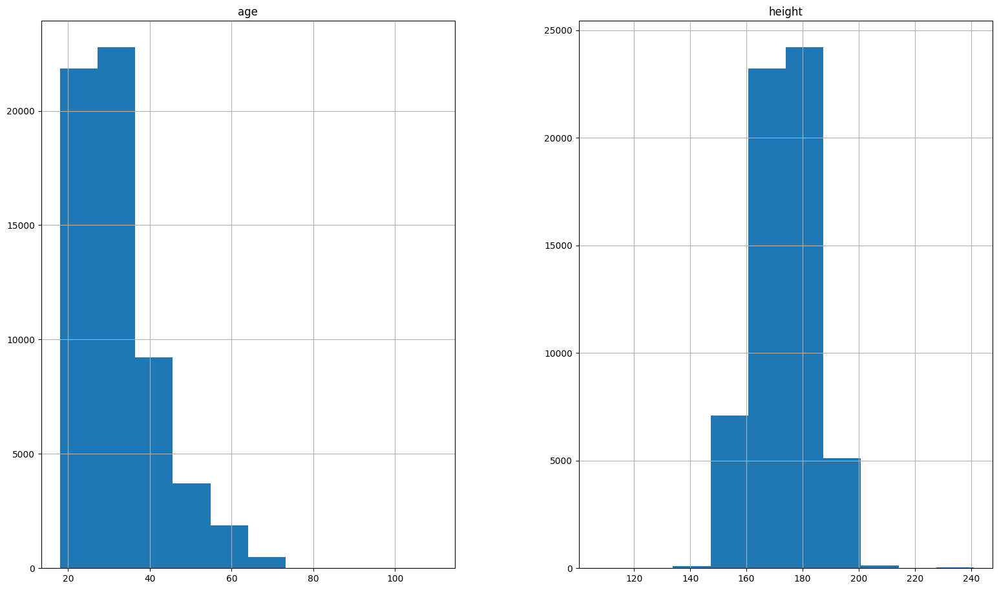

In [ ]:
ok_df.hist(figsize=(19,11))
plt.show()

In [ ]:
# Check skewness
ok_df[['age','height']].skew()

age       1.265773
height    0.038288
dtype: float64

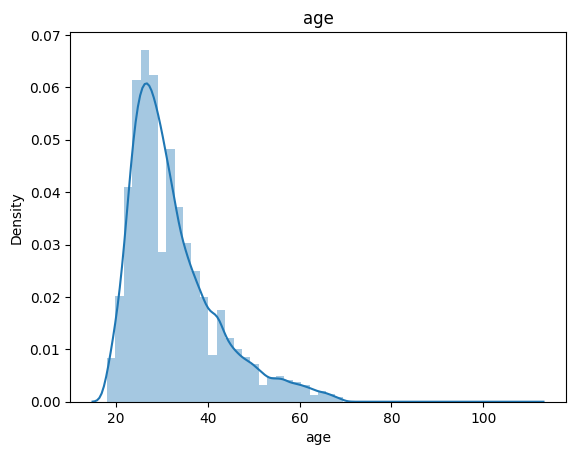

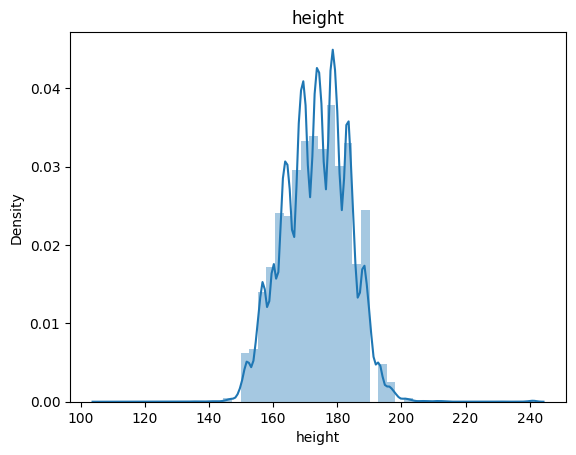

In [ ]:
# Graph distplot of num_cols
for i in num_cols:
    sns.distplot(ok_df[i])
    plt.title(i)
    plt.show()

In [ ]:
fig = px.box(ok_df, y=['age','height'])
fig.show()

In [ ]:
# Remove outliers in age column
# Calculate IQR
q1 = ok_df['age'].quantile(0.25)
q3 = ok_df['age'].quantile(0.75)

IQR = q3 - q1

# Define the lower and upper bounds for outliers
lower_bound = q1 - 1.5 * IQR
upper_bound = q3 + 1.5 * IQR

# Remove outliers
ok_df = ok_df[(ok_df['age'] > lower_bound) & (ok_df['age'] < upper_bound)]

In [ ]:
# Remove outliers in height column
# Calculate IQR
q1 = ok_df['height'].quantile(0.25)
q3 = ok_df['height'].quantile(0.75)

IQR = q3 - q1

# Define the lower and upper bounds for outliers
lower_bound = q1 - 1.5 * IQR
upper_bound = q3 + 1.5 * IQR

# Remove outliers
ok_df = ok_df[(ok_df['height'] > lower_bound) & (ok_df['height'] < upper_bound)]

In [ ]:
ct_cols

['status',
 'sex',
 'orientation',
 'body_type',
 'diet',
 'education',
 'ethnicity',
 'job',
 'last_online',
 'location',
 'religion',
 'sign',
 'smokes',
 'speaks',
 'disease_1',
 'interest_1']

['single' 'available' 'seeing someone' 'married' 'unknown']
status
single            52640
seeing someone     2016
available          1775
married             284
unknown               9
Name: count, dtype: int64
status Length is :  5


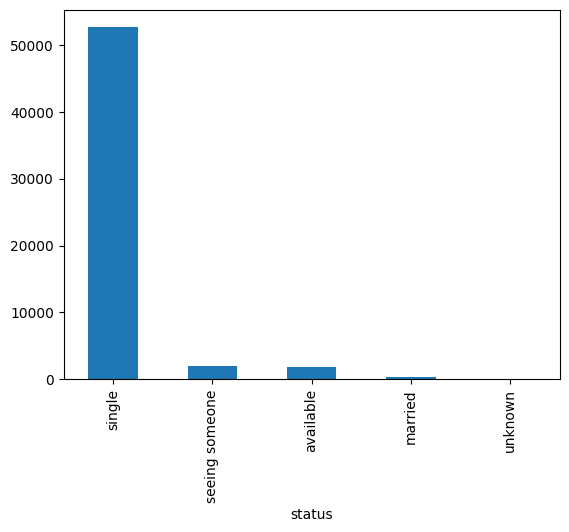

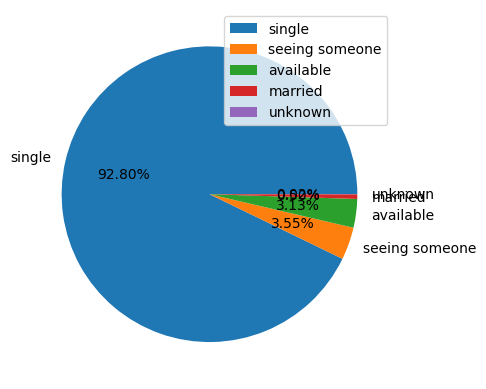

['m' 'f']
sex
m    34242
f    22482
Name: count, dtype: int64
sex Length is :  2


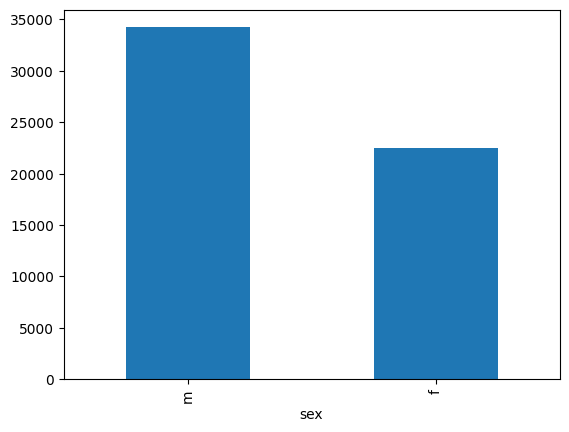

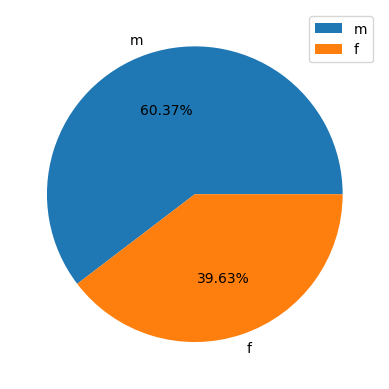

['straight' 'bisexual' 'gay']
orientation
straight    48698
gay          5344
bisexual     2682
Name: count, dtype: int64
orientation Length is :  3


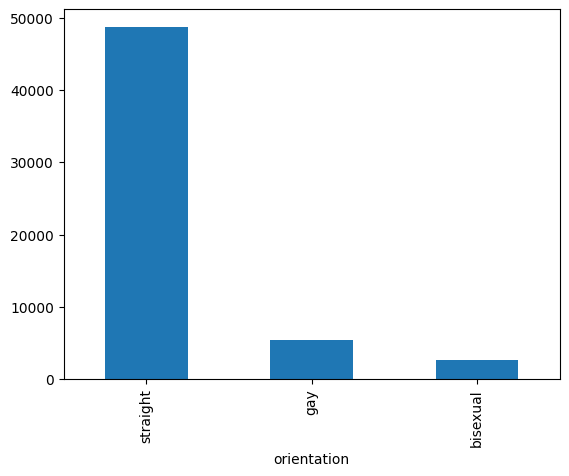

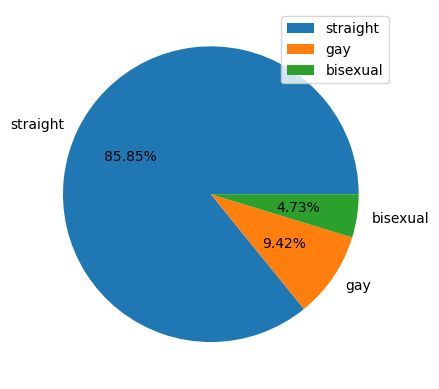

['a little extra' 'average' 'thin' 'athletic' 'fit' nan 'skinny' 'curvy'
 'full figured' 'jacked' 'rather not say' 'used up' 'overweight']
body_type
average           13725
fit               11968
athletic          11382
thin               4476
curvy              3695
a little extra     2368
skinny             1745
full figured        930
jacked              403
overweight          395
used up             332
rather not say      184
Name: count, dtype: int64
body_type Length is :  12


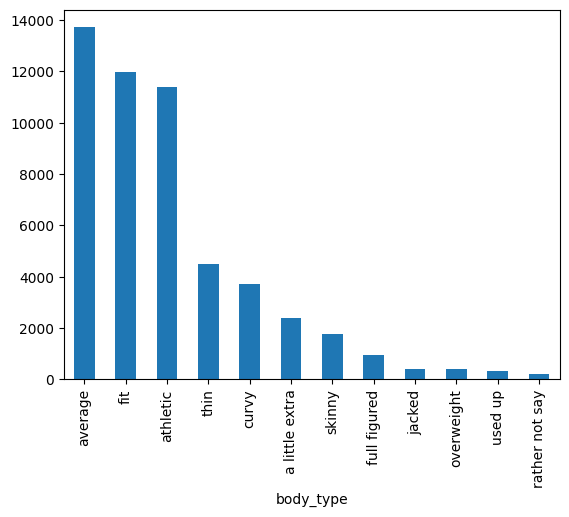

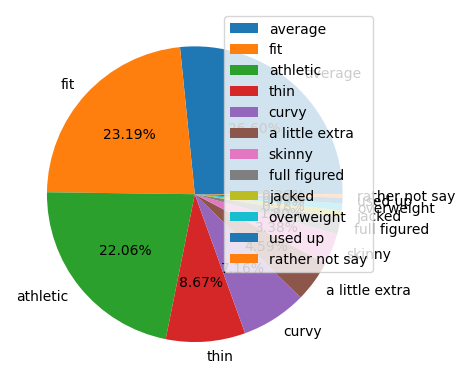

['sometimes' 'no' nan 'when drinking' 'yes' 'trying to quit']
smokes
no                41120
sometimes          3679
when drinking      2994
yes                2163
trying to quit     1419
Name: count, dtype: int64
smokes Length is :  5


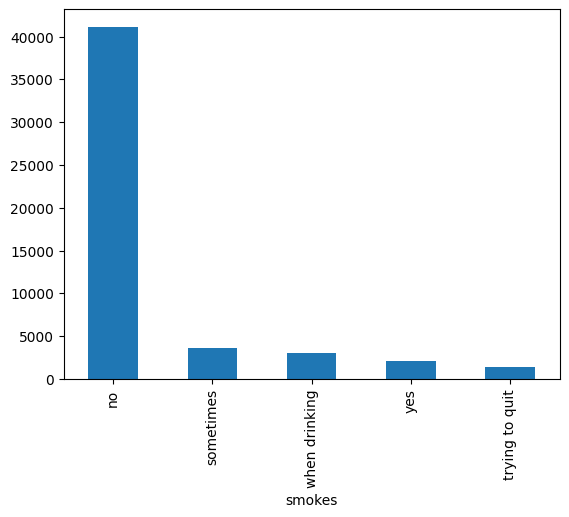

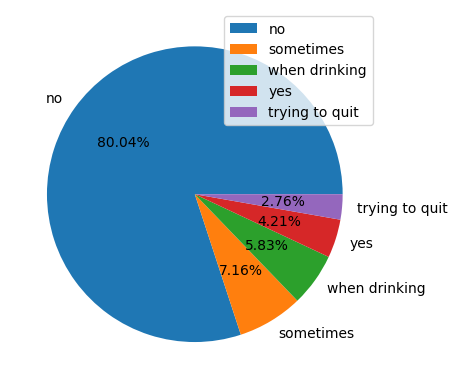

['neurological' 'long term health' "dementia/alzheimer's"
 'substance abuse' 'aging & frailty' 'disabilities & sensory']
disease_1
dementia/alzheimer's      9547
disabilities & sensory    9519
neurological              9453
substance abuse           9416
aging & frailty           9408
long term health          9381
Name: count, dtype: int64
disease_1 Length is :  6


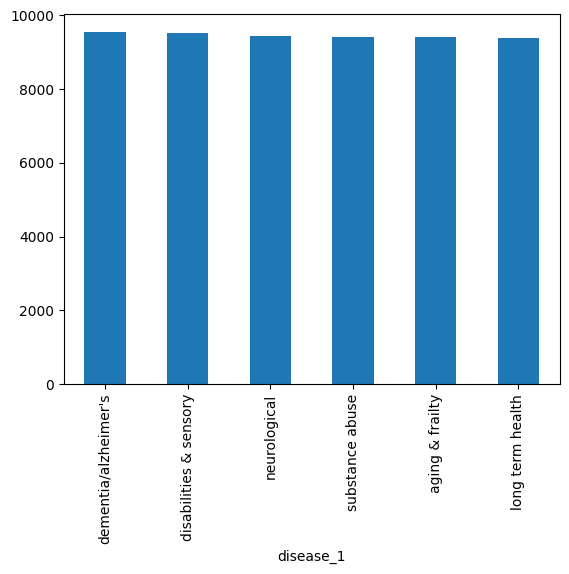

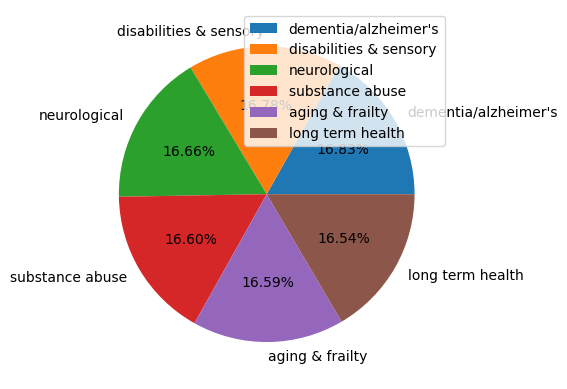

['traveling' 'gardening and landscaping' 'movie or music'
 'collecting antiques and art' 'photography' 'horseback riding'
 'cooking or food lover' 'dancing and singing' 'politics'
 'clay modeling and pottery' 'exercise' 'theatre or drama']
interest_1
cooking or food lover          4903
dancing and singing            4809
gardening and landscaping      4771
photography                    4765
exercise                       4749
clay modeling and pottery      4732
horseback riding               4713
politics                       4704
theatre or drama               4683
collecting antiques and art    4644
traveling                      4640
movie or music                 4611
Name: count, dtype: int64
interest_1 Length is :  12


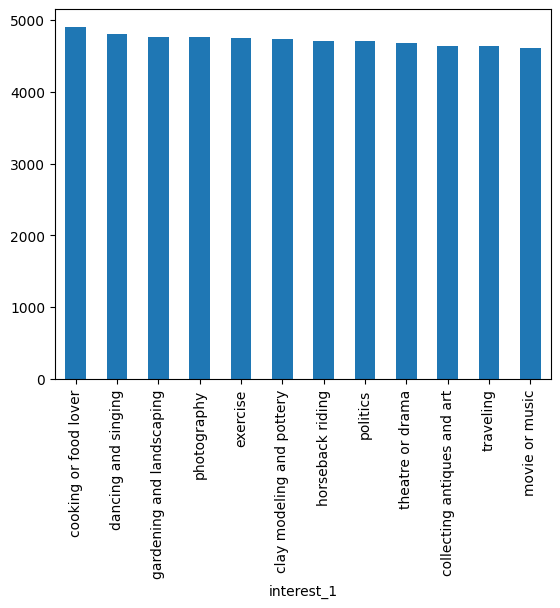

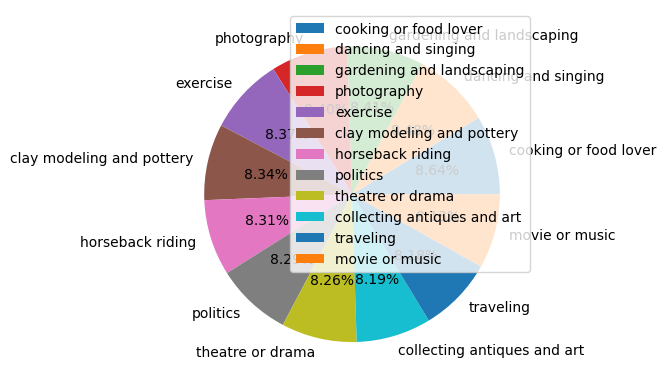

In [ ]:
# Create a for loop to find the values in categorical cols

a = []
for i in ct_cols:
        len(ok_df[i].value_counts())
        
        if len(ok_df[i].value_counts()) < 15:
            print(ok_df[i].unique())
            print(ok_df[i].value_counts())
            
            print(i,'Length is : ',len(ok_df[i].value_counts()))
            ok_df[i].value_counts().plot(kind='bar')
            plt.show()
            
            label = ok_df[i].value_counts().index
            plt.pie(ok_df[i].value_counts(), labels=label, autopct='%.2f%%')
            plt.legend(loc=1)
            plt.show()
            
        else:
            a.append(i)
            

## 3. Data Preprocessing

In [ ]:
# Remaining cols
a

['diet',
 'education',
 'ethnicity',
 'job',
 'last_online',
 'location',
 'religion',
 'sign',
 'speaks']

In [ ]:
# Check uniques values
ok_df['status'].unique()

array(['single', 'available', 'seeing someone', 'married', 'unknown'],
      dtype=object)

In [ ]:
# Replace unknown with NA 
ok_df.loc[ok_df['status'] == 'unknown', 'status'] = np.nan

In [ ]:
ok_df['diet'].unique()

array(['strictly anything', 'mostly other', 'anything', 'vegetarian', nan,
       'mostly anything', 'mostly vegetarian', 'strictly vegan',
       'strictly vegetarian', 'mostly vegan', 'strictly other',
       'mostly halal', 'other', 'vegan', 'mostly kosher',
       'strictly halal', 'halal', 'strictly kosher', 'kosher'],
      dtype=object)

In [ ]:
# Replace other with NA 
ok_df.loc[ok_df['diet'] == 'other', 'diet'] = np.nan

In [ ]:
# Check null values
ok_df.isnull().sum()

age                0
status             9
sex                0
orientation        0
body_type       5121
diet           23326
education       6260
ethnicity       5464
height             0
job             7860
last_online        0
location           0
religion       19540
sign           10416
smokes          5349
speaks            45
disease_1          0
interest_1         0
dtype: int64

In [ ]:
# Fill missing values all cols
ok_df['status'].fillna(ok_df['status'].mode()[0], inplace=True)
ok_df['body_type'].fillna(ok_df['body_type'].mode()[0], inplace=True)
ok_df['education'].fillna(ok_df['education'].mode()[0], inplace=True)
ok_df['height'].fillna(ok_df['height'].mode()[0], inplace=True)
ok_df['sign'].fillna(ok_df['sign'].mode()[0], inplace=True)
ok_df['smokes'].fillna(ok_df['smokes'].mode()[0], inplace=True)
ok_df['speaks'].fillna(ok_df['speaks'].mode()[0], inplace=True)

In [ ]:
# Simplified categories by removing strictly and mostly
ok_df['diet'] = ok_df['diet'].str.replace('strictly ','')
ok_df['diet'] = ok_df['diet'].str.replace('mostly ','')

In [ ]:
# Check uniques values
ok_df['diet'].unique()

array(['anything', 'other', 'vegetarian', nan, 'vegan', 'halal', 'kosher'],
      dtype=object)

In [ ]:
# Replace other with NA 
ok_df.loc[ok_df['diet'] == 'other', 'diet'] = np.nan

In [ ]:
# Fill missing values of diet
ok_df['diet'].fillna(ok_df['diet'].mode()[0], inplace=True)

In [ ]:
# Mapping education values
edu_map = {'working on college/university' : 'university', 
               'working on space camp' : 'space camp',
               'unknown' : 'unknown', 
               'graduated from college/university' : 'university',
               'working on two-year college' : 'college', 
               'graduated from high school' : 'high school',
               'working on masters program' : 'masters degree', 
               'graduated from space camp' : 'space camp',
               'graduated from masters program' : 'masters degree', 
               'college/university' : 'university',
               'graduated from ph.d program' : 'ph.d', 
               'graduated from law school' : 'law school',
               'working on ph.d program' : 'ph.d', 
               'graduated from two-year college' : 'college',
               'dropped out of space camp' : 'space camp', 
               'working on med school' : 'med school',
               'dropped out of college/university' : 'university', 
               'two-year college' : 'college',
               'space camp' : 'space camp', 
               'dropped out of high school' : 'high school',
               'working on high school' : 'high school', 
               'masters program' : 'masters degree',
               'dropped out of ph.d program' : 'ph.d', 
               'dropped out of two-year college' : 'college',
               'dropped out of med school' : 'med school', 
               'high school' : 'high school',
               'graduated from med school' : 'med school', 
               'working on law school' : 'law school', 
               'law school' : 'law school',
               'dropped out of masters program' : 'masters degree', 
               'ph.d program' : 'ph.d',
               'dropped out of law school' : 'law school', 
               'med school' : 'med school', }

In [ ]:
# Mapping to the dictionary
ok_df['education'] = [edu_map[c] for c in ok_df['education']]

In [ ]:
# Unique vals
ok_df['education'].unique()

array(['university', 'space camp', 'masters degree', 'college',
       'high school', 'ph.d', 'law school', 'med school'], dtype=object)

In [ ]:
ok_df['education'].mode()[0]

'university'

In [ ]:
# Split data
ok_df['ethnicity'] = ok_df['ethnicity'].str.split(',').str[0]

In [ ]:
# Check uniques values
ok_df['ethnicity'].unique()

array(['asian', 'white', nan, 'hispanic / latin', 'pacific islander',
       'black', 'middle eastern', 'native american', 'indian', 'other'],
      dtype=object)

In [ ]:
# Replace other with NA
ok_df.loc[ok_df['ethnicity'] == 'other', 'ethnicity'] = np.nan

In [ ]:
# Fill missing val of ethnicity
ok_df['ethnicity'].fillna(ok_df['ethnicity'].mode()[0], inplace=True)

In [ ]:
# Replace missing values with other.
ok_df.loc[(ok_df['job']=='rather not say') | (ok_df['job']=='unemployed'), 'job'] = 'other'
# Split data
ok_df['job'] = ok_df['job'].str.split('/').str[0]

In [ ]:
# Check uniques values
ok_df['job'].unique()

array(['transportation', 'hospitality ', nan, 'student', 'artistic ',
       'computer ', 'banking ', 'entertainment ', 'sales ', 'other',
       'medicine ', 'science ', 'executive ', 'education ', 'clerical ',
       'construction ', 'political ', 'law ', 'military', 'retired'],
      dtype=object)

In [ ]:
# Replcae with NA
ok_df.loc[ok_df['job'] == 'other', 'job'] = np.nan

In [ ]:
# Fill missing value
ok_df['job'].fillna(ok_df['job'].mode()[0], inplace=True)

In [ ]:
# Split data
ok_df['location'] = ok_df['location'].str.split(', ').str[1]

In [ ]:
# Check uniques values
ok_df['location'].unique()

array(['california', 'colorado', 'new york', 'oregon', 'arizona',
       'hawaii', 'montana', 'wisconsin', 'virginia', 'spain', 'illinois',
       'vietnam', 'ireland', 'louisiana', 'michigan', 'texas',
       'united kingdom', 'massachusetts', 'north carolina', 'idaho',
       'mississippi', 'new jersey', 'florida', 'minnesota', 'georgia',
       'utah', 'west virginia', 'connecticut', 'tennessee',
       'rhode island', 'district of columbia', 'british columbia',
       'missouri', 'pennsylvania', 'netherlands', 'switzerland', 'ohio',
       'washington'], dtype=object)

In [ ]:
# Split data
ok_df['religion'] = ok_df['religion'].str.split(' ').str[0]

In [ ]:
# Check uniques values
ok_df['religion'].unique()

array(['agnosticism', nan, 'atheism', 'christianity', 'other',
       'catholicism', 'buddhism', 'judaism', 'hinduism', 'islam'],
      dtype=object)

In [ ]:
# Replace other with NA 
ok_df.loc[ok_df['religion'] == 'other', 'religion'] = np.nan

In [ ]:
# Fill missing value of religion
ok_df['religion'].fillna(ok_df['religion'].mode()[0], inplace=True)

In [ ]:
# Split data
ok_df['sign'] = ok_df['sign'].str.split(' ').str[0]

In [ ]:
# Check uniques values
ok_df['sign'].unique()

array(['gemini', 'cancer', 'pisces', 'aquarius', 'taurus', 'virgo',
       'sagittarius', 'leo', 'aries', 'libra', 'scorpio', 'capricorn'],
      dtype=object)

In [ ]:
# Split data
ok_df['speaks'] = ok_df['speaks'].str.split(' ').str[0]
ok_df['speaks'] = ok_df['speaks'].str.replace(',','')

In [ ]:
# Check uniques values
ok_df['speaks'].unique()

array(['english', 'afrikaans', 'french', 'portuguese'], dtype=object)

In [ ]:
# Check uniques values
ok_df['last_online'].unique()

array(['2012-06-28-20-30', '2012-06-29-21-41', '2012-06-27-09-10', ...,
       '2012-06-02-08-16', '2012-02-17-20-44', '2012-06-14-16-51'],
      dtype=object)

In [ ]:
# Split data
ok_df['last_online'] = ok_df['last_online'].str[0:7]

['anything' 'vegetarian' 'vegan' 'halal' 'kosher']
diet
anything      51222
vegetarian     4644
vegan           674
kosher          110
halal            74
Name: count, dtype: int64
diet Length is :  5


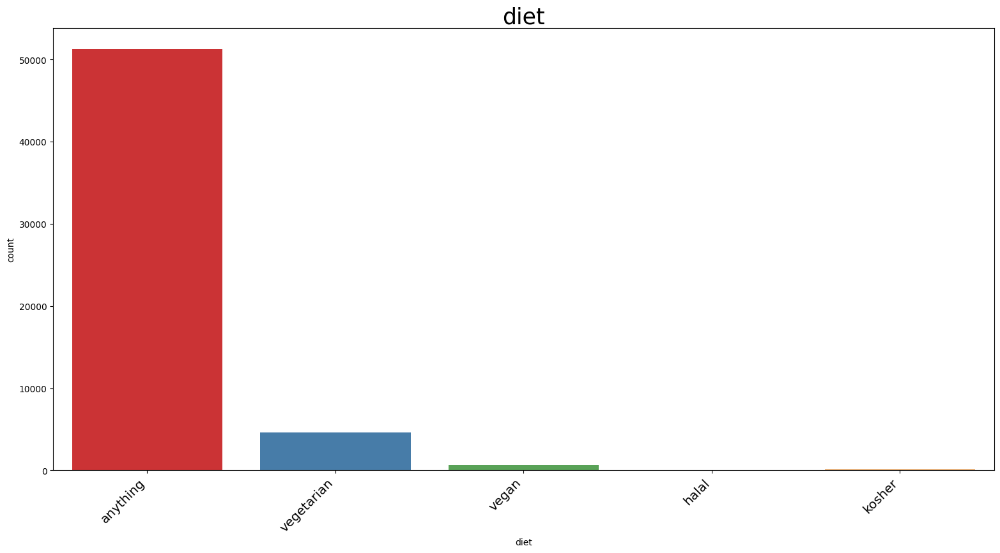

['university' 'space camp' 'masters degree' 'college' 'high school' 'ph.d'
 'law school' 'med school']
education
university        36416
masters degree    10148
college            2781
ph.d               2224
space camp         1597
high school        1583
law school         1327
med school          648
Name: count, dtype: int64
education Length is :  8


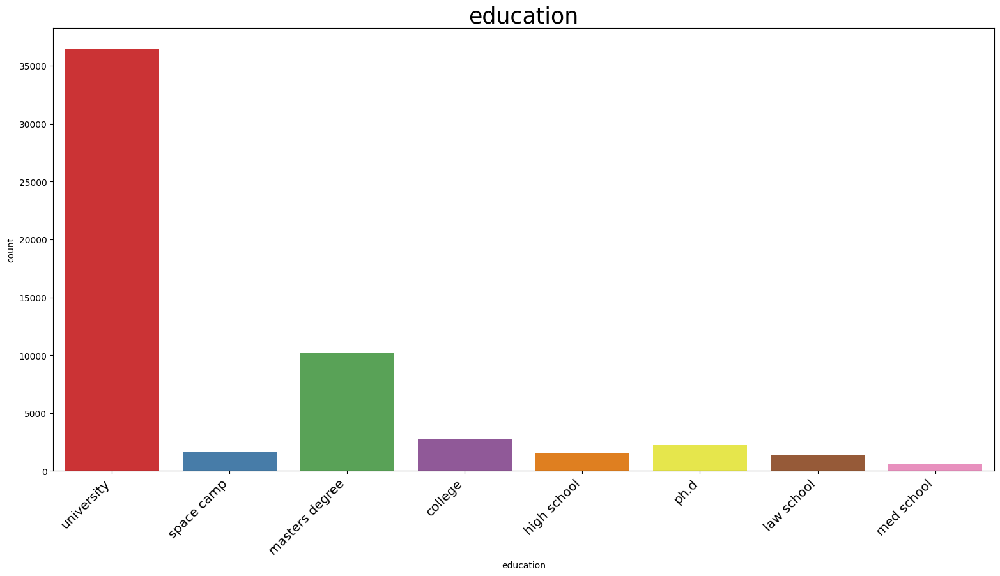

['asian' 'white' 'hispanic / latin' 'pacific islander' 'black'
 'middle eastern' 'native american' 'indian']
ethnicity
white               38184
asian                7997
hispanic / latin     4248
black                2951
indian               1183
middle eastern        788
pacific islander      700
native american       673
Name: count, dtype: int64
ethnicity Length is :  8


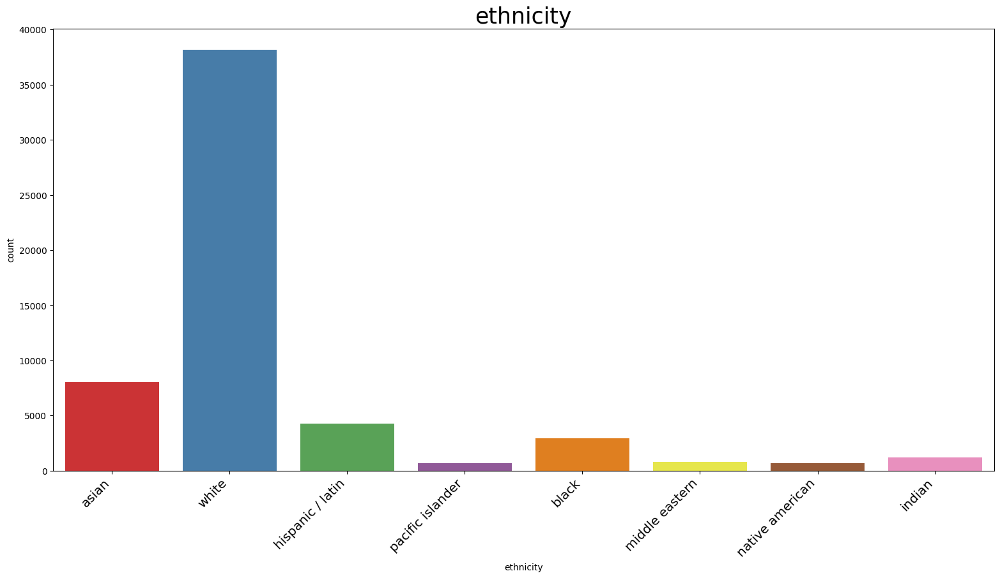

['transportation' 'hospitality ' 'student' 'artistic ' 'computer '
 'banking ' 'entertainment ' 'sales ' 'medicine ' 'science ' 'executive '
 'education ' 'clerical ' 'construction ' 'political ' 'law ' 'military'
 'retired']
job
student           20422
science            4699
computer           4565
sales              4204
artistic           4118
medicine           3346
education          3254
executive          2197
entertainment      2176
banking            2165
hospitality        1319
law                1292
construction        932
clerical            750
political           651
transportation      332
military            198
retired             104
Name: count, dtype: int64
job Length is :  18


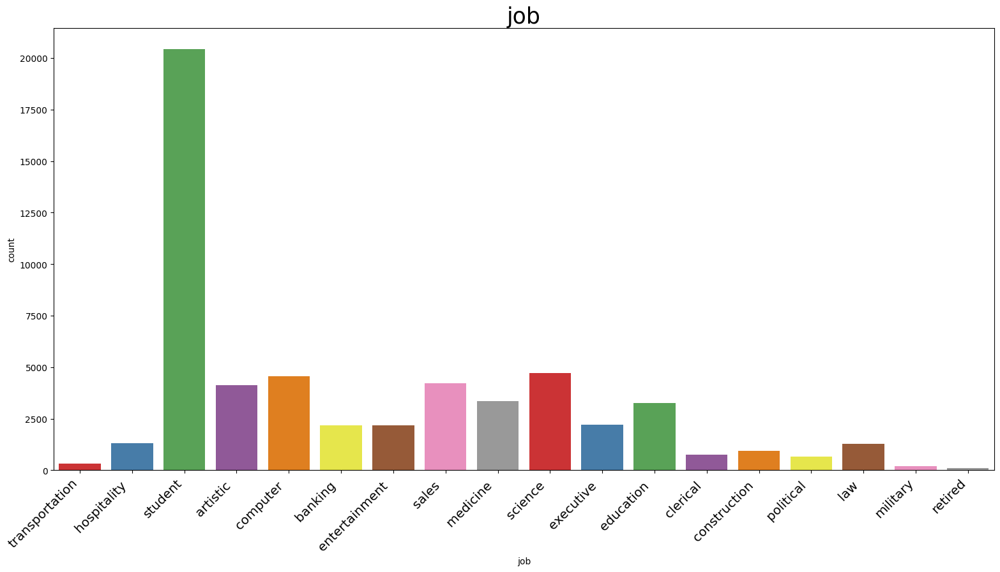

['2012-06' '2012-05' '2011-11' '2012-03' '2011-10' '2012-04' '2012-02'
 '2011-12' '2012-01' '2011-07' '2011-09' '2011-08' '2011-06' '2012-07']
last_online
2012-06    40167
2012-05     3576
2012-04     2360
2012-07     1996
2012-03     1774
2012-02     1255
2012-01     1170
2011-12      908
2011-11      808
2011-10      762
2011-09      665
2011-08      607
2011-07      594
2011-06       82
Name: count, dtype: int64
last_online Length is :  14


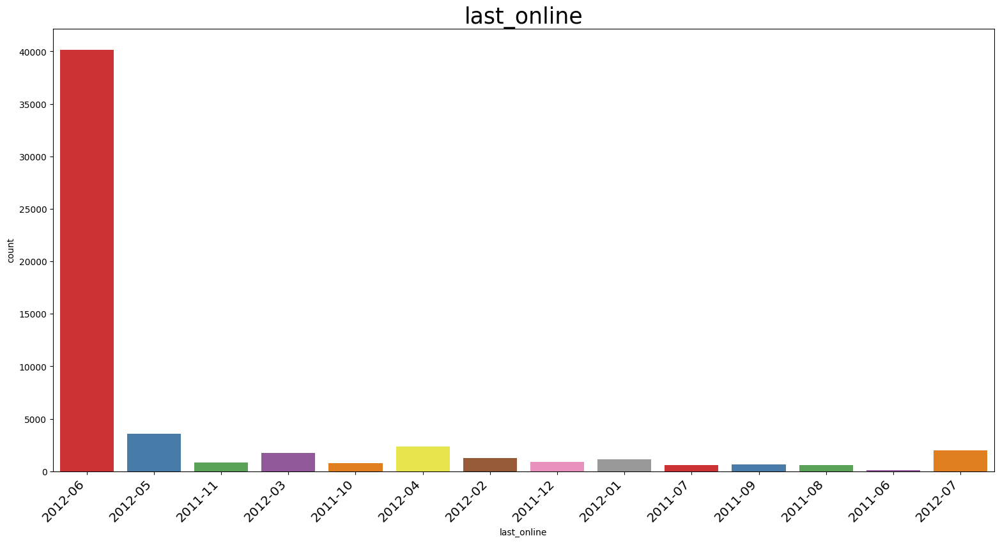

['california' 'colorado' 'new york' 'oregon' 'arizona' 'hawaii' 'montana'
 'wisconsin' 'virginia' 'spain' 'illinois' 'vietnam' 'ireland' 'louisiana'
 'michigan' 'texas' 'united kingdom' 'massachusetts' 'north carolina'
 'idaho' 'mississippi' 'new jersey' 'florida' 'minnesota' 'georgia' 'utah'
 'west virginia' 'connecticut' 'tennessee' 'rhode island'
 'district of columbia' 'british columbia' 'missouri' 'pennsylvania'
 'netherlands' 'switzerland' 'ohio' 'washington']
location
california              56637
new york                   17
illinois                    8
massachusetts               5
oregon                      4
texas                       4
michigan                    4
arizona                     3
florida                     3
united kingdom              2
minnesota                   2
georgia                     2
district of columbia        2
spain                       2
virginia                    2
utah                        2
ohio                        2
hawaii    

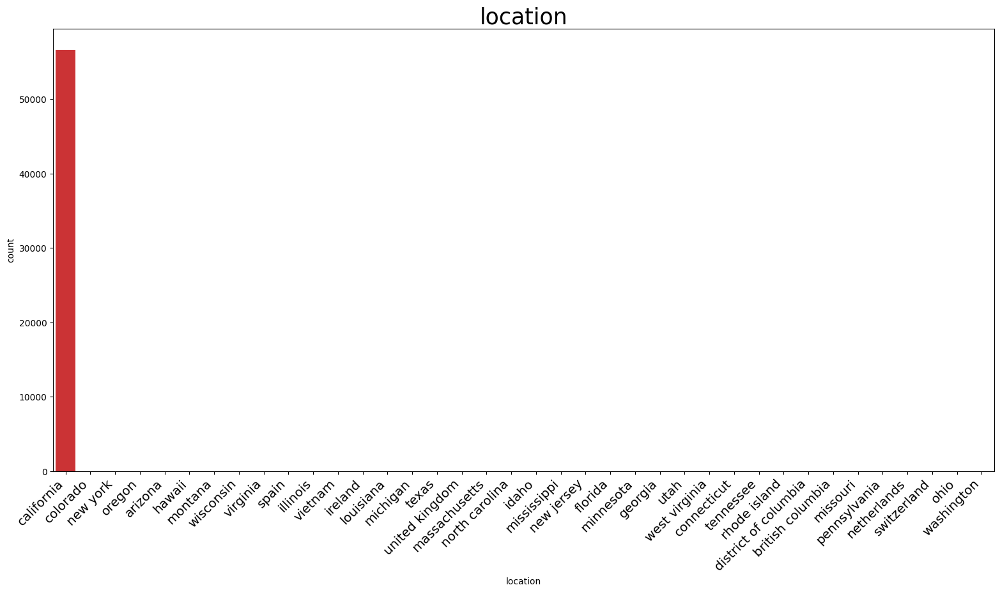

['agnosticism' 'atheism' 'christianity' 'catholicism' 'buddhism' 'judaism'
 'hinduism' 'islam']
religion
agnosticism     34969
atheism          6762
christianity     5370
catholicism      4525
judaism          2774
buddhism         1749
hinduism          441
islam             134
Name: count, dtype: int64
religion Length is :  8


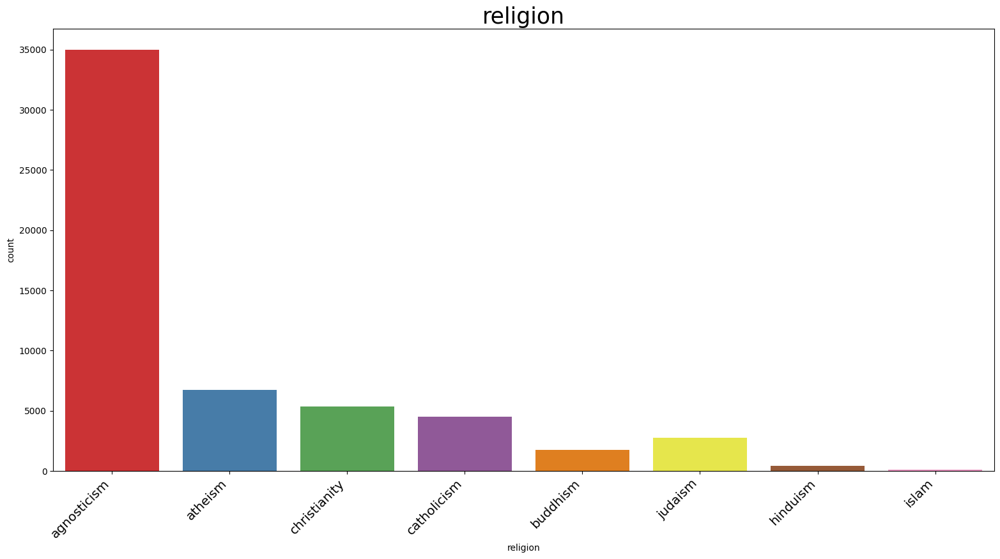

['gemini' 'cancer' 'pisces' 'aquarius' 'taurus' 'virgo' 'sagittarius'
 'leo' 'aries' 'libra' 'scorpio' 'capricorn']
sign
gemini         14497
leo             4156
libra           3986
cancer          3985
virgo           3934
scorpio         3921
taurus          3904
aries           3763
sagittarius     3740
pisces          3733
aquarius        3710
capricorn       3395
Name: count, dtype: int64
sign Length is :  12


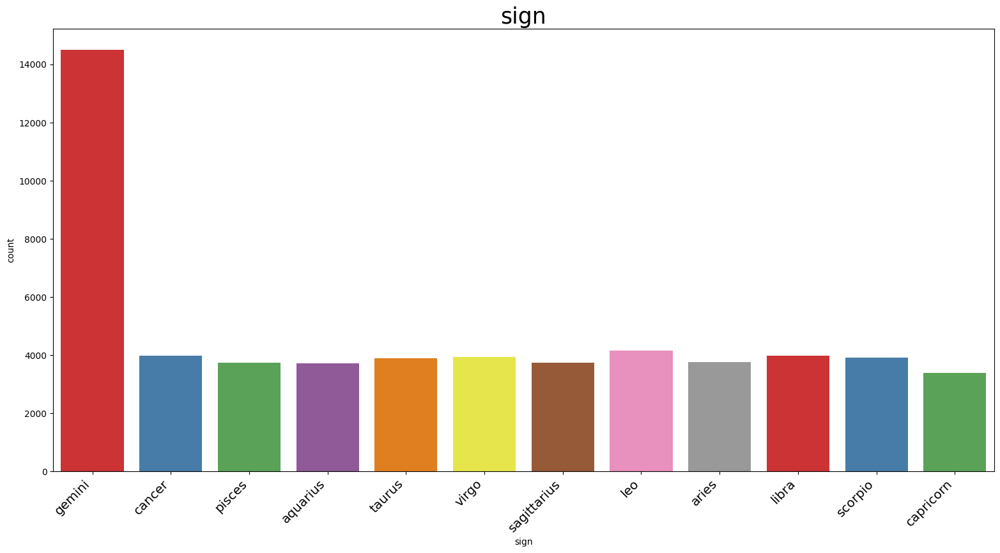

['english' 'afrikaans' 'french' 'portuguese']
speaks
english       56720
french            2
afrikaans         1
portuguese        1
Name: count, dtype: int64
speaks Length is :  4


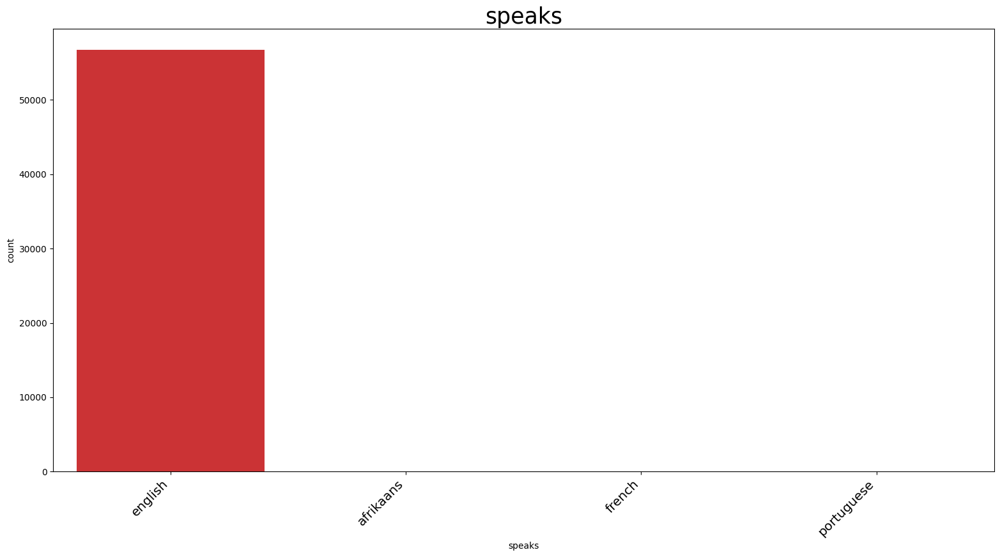

In [ ]:
# Create a for loop to find the values in categorical cols

b = []
for i in a:
        len(ok_df[i].value_counts())

        
        if len(ok_df[i].value_counts()) < 100:
            print(ok_df[i].unique())
            print(ok_df[i].value_counts())     
            print(i,'Length is : ',len(ok_df[i].value_counts()))

            plt.figure(figsize=(19,9))
            chart = sns.countplot(data=ok_df, x=ok_df[i], palette='Set1')
            chart.set_xticklabels(
            chart.get_xticklabels(), 
            rotation=45, 
            horizontalalignment='right',
            fontweight='light',
            fontsize='x-large')   
            chart.set_title(i, fontdict={'size': 25})
            plt.show()
            
            
        else:
            b.append(i)

In [ ]:
# All categorical columns has solved.
b

[]

## 4. Model build

In [ ]:
# importing scikit learn library
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.pipeline import make_pipeline
from sklearn.compose import ColumnTransformer
from sklearn.neighbors import NearestNeighbors

In [ ]:
# Visualize Pipeline
from sklearn import set_config

set_config(display="diagram")

In [ ]:
# Use ColumnTransformer to convert categorical cols into numerical form
cat_cols = ['status', 'sex','disease_1', 'interest_1','disease_2', 'interest_2','disease_3', 'interest_3']

trf1 = ColumnTransformer(
    transformers=[
        ('oh_encoding', OneHotEncoder(sparse=False, handle_unknown='ignore', drop='first', dtype='int'), cat_cols)
    ],
)

trf1

ColumnTransformer(transformers=[('oh_encoding',
                                 OneHotEncoder(drop='first', dtype='int',
                                               handle_unknown='ignore',
                                               sparse=False),
                                 ['status', 'sex', 'disease_1', 'interest_1',
                                  'disease_2', 'interest_2', 'disease_3',
                                  'interest_3'])])

In [ ]:
# ok_df = ok_df[['age', 'height', 'status', 'sex', 'orientation', 'body_type', 'diet', 'education', 'ethnicity', 'job', 'last_online', 'location', 'religion', 'sign', 'smokes', 'speaks', 'disease', 'interest']]

In [ ]:
# Drop unnecessary columns
ok_df.drop(columns=['age', 'height', 'orientation', 'body_type', 'diet', 'education', 'ethnicity', 'job', 'last_online', 'location', 'religion', 'sign', 'smokes', 'speaks'], axis=1, inplace=True)

In [ ]:
# Add a disease and interest column randomly

lst_dis = ["dementia/alzheimer's",'neurological','long term health','disabilities & sensory', 'aging & frailty', 'substance abuse']
lst_int = ['traveling', 'exercise', 'photography', 'theatre or drama', 'dancing and singing', 'collecting antiques and art', 'cooking or food lover', 
           'politics', 'movie or music', 'clay modeling and pottery', 'gardening and landscaping', 'horseback riding']
ok_df['disease_2'] = np.random.choice(lst_dis, ok_df.shape[0])
ok_df['interest_2'] = np.random.choice(lst_int, ok_df.shape[0])
ok_df['disease_3'] = np.random.choice(lst_dis, ok_df.shape[0])
ok_df['interest_3'] = np.random.choice(lst_int, ok_df.shape[0])

In [ ]:
ok_df.head(3)

,status,sex,disease_1,interest_1,disease_2,interest_2,disease_3,interest_3
0,single,m,neurological,traveling,long term health,movie or music,dementia/alzheimer's,collecting antiques and art
1,single,m,long term health,gardening and landscaping,neurological,photography,neurological,collecting antiques and art
2,available,m,long term health,movie or music,aging & frailty,clay modeling and pottery,dementia/alzheimer's,cooking or food lover


In [ ]:
# Look how many categorical columns have labesls variable.
for i in ok_df.columns:
    if ok_df[i].dtype == 'O':
        print(i, ":", len(ok_df[i].unique()),'labes')

status : 4 labes
sex : 2 labes
disease_1 : 6 labes
interest_1 : 12 labes
disease_2 : 6 labes
interest_2 : 12 labes
disease_3 : 6 labes
interest_3 : 12 labes


In [ ]:
# Check data shape
ok_df.shape

(56724, 8)

In [ ]:
# Check null values
ok_df.isnull().sum()

status        0
sex           0
disease_1     0
interest_1    0
disease_2     0
interest_2    0
disease_3     0
interest_3    0
dtype: int64

In [ ]:
# Split dataset into featurs X
X = ok_df

In [ ]:
X.sample(5)

,status,sex,disease_1,interest_1,disease_2,interest_2,disease_3,interest_3
40053,single,f,disabilities & sensory,traveling,long term health,politics,long term health,clay modeling and pottery
53238,single,m,long term health,horseback riding,aging & frailty,horseback riding,long term health,horseback riding
18425,single,m,dementia/alzheimer's,gardening and landscaping,long term health,theatre or drama,dementia/alzheimer's,exercise
38841,available,m,aging & frailty,photography,long term health,dancing and singing,long term health,gardening and landscaping
6420,single,m,neurological,dancing and singing,disabilities & sensory,horseback riding,aging & frailty,exercise


In [ ]:
X.shape

(56724, 8)

In [ ]:
# Using Nearest Neighbors
nbrs = NearestNeighbors(n_neighbors=6)
# nbrs.fit(X_scaled)

In [ ]:
# Using KMeans
model = KMeans(n_clusters=6, n_init='warn', init='k-means++', algorithm='auto')

In [ ]:
# Final pipeline
pipe = make_pipeline(trf1,model)

In [ ]:
pipe.set_output(transform='pandas')

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('oh_encoding',
                                                  OneHotEncoder(drop='first',
                                                                dtype='int',
                                                                handle_unknown='ignore',
                                                                sparse=False),
                                                  ['status', 'sex', 'disease_1',
                                                   'interest_1', 'disease_2',
                                                   'interest_2', 'disease_3',
                                                   'interest_3'])])),
                ('kmeans', KMeans(algorithm='auto', n_clusters=6))])

In [ ]:
pipe.fit(X)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('oh_encoding',
                                                  OneHotEncoder(drop='first',
                                                                dtype='int',
                                                                handle_unknown='ignore',
                                                                sparse=False),
                                                  ['status', 'sex', 'disease_1',
                                                   'interest_1', 'disease_2',
                                                   'interest_2', 'disease_3',
                                                   'interest_3'])])),
                ('kmeans', KMeans(algorithm='auto', n_clusters=6))])

## Testing

In [ ]:
# Experiment
ok_df.loc[32963].values

array(['single', 'f', 'aging & frailty', 'theatre or drama',
       "dementia/alzheimer's", 'cooking or food lover',
       'disabilities & sensory', 'collecting antiques and art'],
      dtype=object)

In [ ]:
# Assume user input
test = np.array([['single', 'f', 'aging & frailty', 'photography', "dementia/alzheimer's", 'horseback riding', 'neurological',
       'horseback riding']],dtype=object).reshape(1,8)
test

array([['single', 'f', 'aging & frailty', 'photography',
        "dementia/alzheimer's", 'horseback riding', 'neurological',
        'horseback riding']], dtype=object)

In [ ]:
pipe.predict(test)

ValueError: Specifying the columns using strings is only supported for pandas DataFrames

## Exporting the pipeline

In [ ]:
# Export 
import pickle
pickle.dump(pipe,open('pipe.pkl','wb'))

## Experiment cols

In [ ]:
X_scaled = trf1.fit_transform(X)

In [ ]:
X_scaled.head(2)

In [ ]:
X_scaled.dtype

In [ ]:
X_scaled.shape

In [ ]:
# Apply Dimensonality reduction
pca = PCA(n_components=20)
X_pca = pca.fit_transform(X_scaled)

print('Explained variance :', pca.explained_variance_.sum())
print('Explained variance ratio', pca.explained_variance_ratio_.sum())

In [ ]:
# Graph the PCA plot
PC_numbers = np.arange(pca.n_components_) + 1
prop_var = pca.explained_variance_ratio_
eigenvalues = pca.explained_variance_

plt.plot(PC_numbers, prop_var, 'ro-')
plt.title('Figure 1: Scree Plot', fontsize=8)
plt.ylabel('Proportion of Variance', fontsize=8)
plt.show()

In [ ]:
# Use Elbow method
# The lower the inertia value, the better the clustering
opt = range(1,18)
inertia = []

for i in opt:
    kmeans = KMeans(n_clusters= i, n_init='warn', init='k-means++', algorithm='auto')
    kmeans.fit(X_scaled)
    inertia.append(kmeans.inertia_)

In [ ]:
# Plot Elbow graph
plt.plot(opt, inertia, '-*')
plt.show()

In [ ]:
distance, suggestions = nbrs.kneighbors(X_scaled.iloc[[41051]].values, n_neighbors=10)

In [ ]:
for i in range(len(suggestions)):
    print(X.index[suggestions[i]])
    print('\n')
    print(X.values[suggestions[i]])

In [ ]:
X.iloc[[15872]].values.reshape(1,-1)

In [ ]:
# Predict the model
pred = model.fit_predict(X_scaled)

In [ ]:
pred

In [ ]:
#Getting unique labels and Centroids
centroids = model.cluster_centers_
labels = np.unique(pred)

In [ ]:
centroids[0]

In [ ]:
labels

In [ ]:
y = X_scaled.values

NameError: name 'X_scaled' is not defined

In [ ]:
y[pred == 1,0]

NameError: name 'y' is not defined

In [ ]:
# graph of cluster
plt.scatter(y[pred == 0 , 0] , y[pred == 0 , 1] , color='red')
plt.scatter(y[pred == 1 , 0] , y[pred == 1 , 1] , color='green')
plt.scatter(y[pred == 2 , 0] , y[pred == 2 , 1] , color='blue')
plt.scatter(y[pred == 3 , 0] , y[pred == 3 , 1] , color='yellow')
plt.scatter(y[pred == 4 , 0] , y[pred == 4 , 1] , color='purple')
plt.scatter(y[pred == 5 , 0] , y[pred == 5 , 1] , color='brown')
# plt.scatter(y[pred == 6 , 0] , y[pred == 6 , 1] , color='pink')
# plt.scatter(y[pred == 7 , 0] , y[pred == 7 , 1] , color='orange')
# plt.scatter(y[pred == 8 , 0] , y[pred == 8 , 1] , color='gray')
plt.scatter(centroids[:,0] , centroids[:,1] , s = 80, color = 'k')
plt.legend(labels)
plt.show()

NameError: name 'y' is not defined

In [ ]:
centroids.shape

In [ ]:
model.labels_

In [ ]:
ok_df['cluster']= pred
ok_df['segment']= model.labels_

In [ ]:
ok_df['cluster'] = ok_df['cluster'].map({0: "cluster 1", 1: "cluster 2", 2: "cluster 3", 
                                         3: "cluster 4", 4: "cluster 5", 5: 'cluster 6', 
                                         })

In [ ]:
ok_df.sample(8)